# CNN 개요
<img src = "https://drive.google.com/uc?id=1vl73MUOxobbZcqDf84vyeuUPAu--l2it" height = 200 width = 500>

- CNN (합성곱 신경망)은 이미지 인식 분야의 기초가 되는 신경망
- 합성곱 계층(Convolution layer), 풀링 계층(Pooling layer), 완전연결 계층(Fully-Connected layer)으로 틀을 구성

**1. 계층 특징**
- 합성곱 계층은 데이터의 형상을 잘 보존하면서 전달하므로 이미지 데이터 처리에 적합
 - 완전연결 계층은 데이터의 형상을 반영하기 어려움
- 풀링 계층은 합성곱 계층으로부터 전달받은 데이터를 가로와 세로 방향으로 압축(채널에 독립)
- 완전연결 계층은 CNN의 출력층 부분에서 데이터를 평탄화하고 분류를 결정

**2. 관련 용어**
- 패딩 : 합성곱 연산 전에 입력 데이터 주변을 0과 같은 특정 값으로 채워주는 처리
- 스트라이드 : 필터를 적용하는 위치의 간격

# CNN을 적용한 EMNIST dataset 분류

**라이브러리**

In [ ]:
# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
import torchsummary
import torch.optim as optim
from torch.utils.data import Subset
from torchvision import models

# etc
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from google.colab import files

**런타임 유형 확인**
>GPU : `'cuda'` | CPU : `'cpu'`

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"device: {device}")

device: cpu


## 1) 데이터셋 불러오기 및 전처리

**EMNIST Dataset**
- 알파벳(A-Za-z ; 대문자와 소문자의 구분이 어려운 경우 대문자로 통일)과 숫자(0-9)로 이루어진 데이터 ; 총 47개의 클래스로 구성
- 클래스 비율을 맞춘 'balanced' 상태로 데이터셋 이용

**47 labels**
- 숫자 : '0', '1', '2', '3', '4', '5', '6', '7', '8', '9'
- 대문자 : 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z'
- 소문자 : 'a', 'b', 'd', 'e', 'f', 'g', 'h', 'n', 'q', 'r', 't'

<img src = "https://drive.google.com/uc?id=1tNMkoMnzMOsViOMHg8hslNgH4enV_2O-" height = 200 width = 500>

`torchvision.datasets`에서 EMNIST 데이터셋 불러오기

In [ ]:
train_data = torchvision.datasets.EMNIST(root='./data/EMNIST',
                                         split='balanced', # 클래스 비율 맞춤
                                         train=True,
                                         download=True,
                                         transform=transforms.ToTensor())
test_data = torchvision.datasets.EMNIST(root='./data/EMNIST',
                                        split='balanced',
                                        train=False,
                                        download=True,
                                        transform=transforms.ToTensor())

  0%|          | 0/561753746 [00:00<?, ?it/s]

Extracting ./data/EMNIST/EMNIST/raw/gzip.zip to ./data/EMNIST/EMNIST/raw


`train_data`를 다시 train과 validation 용으로 8:2 분할

In [ ]:
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset
# 인덱스로 간접 분할
train_indices, val_indices, _, _ = train_test_split(range(len(train_data)),
                                                    train_data.targets,
                                                    stratify=train_data.targets, # 클래스 비율 맞춤
                                                    test_size=0.2)

# 분할된 인덱스로 데이터셋 분할
train_split = Subset(train_data, train_indices)
valid_split = Subset(train_data, val_indices)

In [ ]:
# 주의) 아래 코드는 실행은 되지만 적절하지 않음! why? torch.utils.data.DataLoader(dataset, ...) 형태로 사용해야 하기 때문
# train_test_split은 target을 input에서 분리하여 반환하는데, 위의 dataset은 input과 target이 함께 들어있어야 함
# 
# from sklearn.model_selection import train_test_split
# from torch.utils.data import Subset 
# x_train, x_valid, y_train, y_valid = train_test_split(train_data.data,
#                                                       train_data.targets,
#                                                       stratify=train_data.targets,
#                                                       test_size=0.2)

train / validation / test set 데이터 개수

In [ ]:
len(train_split), len(valid_split), len(test_data)

(90240, 22560, 18800)

클래스 개수, 채널 개수, 하이퍼파라미터 설정
- 흑백 데이터의 입력 채널 개수 : 1 / rgb 컬러 데이터의 입력 채널 개수 : 3
- `batch_size` 지정
- `learning_rate` 지정
- `num_epochs` 지정

In [ ]:
num_classes = 47
in_channel = 1 # 흑백

# hyperparameter
batch_size = 64
learning_rate = 0.001
num_epochs = 20

데이터로더 형태로 변환

In [ ]:
train_loader = torch.utils.data.DataLoader(train_split, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(valid_split, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)

In [ ]:
print(len(train_split)/batch_size, len(valid_split)/batch_size, len(test_data)/batch_size)
print(len(train_loader), len(valid_loader), len(test_loader))

1410.0 352.5 293.75
1410 353 294


`train_data`에서 예시 이미지 시각화

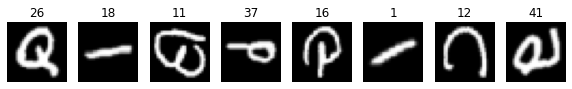

In [ ]:
def image_show(dataset, num):
    fig = plt.figure(figsize=(10,10))

    for i in range(num):
        plt.subplot(1, num, i+1)
        plt.imshow(dataset[i+1200][0].squeeze(), cmap="gray") # squeeze() : shape(또는 size())에서 1인 축을 제거
        plt.axis('off')
        plt.title(dataset[i+1200][1]) # 정답 레이블

image_show(train_data, 8)

In [ ]:
# 텐서 shape 관련 연습
# 유사 기능 함수 : (size(), shape) / (view(), reshape())
print(train_data.data.view(-1,28*28),
      train_data.targets,
      train_data.data.shape,
      train_data.data.size(),
      train_data.data.size(0),
      train_data.data.size(2),
      train_data.data.reshape(-1,28*28),
      (train_data.data.view(-1,28*28)==train_data.data.reshape(-1,28*28)).all(), sep='\n\n')

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)

tensor([45, 36, 43,  ..., 23, 31,  8])

torch.Size([112800, 28, 28])

torch.Size([112800, 28, 28])

112800

28

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)

tensor(True)


✔︎ tensor의 contiguous 여부 ; 메모리 주소의 stride 확인
- [view와 reshape의 목적 차이](https://stackoverflow.com/questions/49643225/whats-the-difference-between-reshape-and-view-in-pytorch)  
`view` : reshaping + **compulsory sharing** $\rightarrow$ applicable only to the contiguous tensor  
`reshape` : reshaping + **optional sharing**

In [ ]:
import torch
z = torch.zeros(3,2)
print('z',z)
zv = z.view(6)
zr = z.reshape(6)
print('zv',zv) # reshaped
print('zr',zr) # reshaped

print('\nEX 1')
z[0] = 1
print('z',z)
print('zv',zv) # shared
print('zr',zr) # shared
print(z.is_contiguous())

z tensor([[0., 0.],
        [0., 0.],
        [0., 0.]])
zv tensor([0., 0., 0., 0., 0., 0.])
zr tensor([0., 0., 0., 0., 0., 0.])

EX 1
z tensor([[1., 1.],
        [0., 0.],
        [0., 0.]])
zv tensor([1., 1., 0., 0., 0., 0.])
zr tensor([1., 1., 0., 0., 0., 0.])
True


In [ ]:
# 가로 방향을 우선으로 메모리 주소의 stride 확인
for i in range(3):
    for j in range(2):
        print(z[i][j].data_ptr())

117372352
117372356
117372360
117372364
117372368
117372372


In [ ]:
print('EX 2')
zt = z.t() # transpose
print('zt',zt)
ztv = zt.view(6) # error

EX 2
zt tensor([[1., 0., 0.],
        [1., 0., 0.]])


RuntimeError: ignored

In [ ]:
print('EX 3')
zt = z.t() # transpose
print('zt',zt)
ztr = zt.reshape(6)
print('ztr',ztr) # reshaped
print(zt.is_contiguous())

print('\nEX 4')
z[1] = 2
zt[1][2] = 3
print('z',z)
print('zt',zt)
print('ztr',ztr) # not shared

EX 3
zt tensor([[1., 0., 0.],
        [1., 0., 0.]])
ztr tensor([1., 0., 0., 1., 0., 0.])
False

EX 4
z tensor([[1., 1.],
        [2., 2.],
        [0., 3.]])
zt tensor([[1., 2., 0.],
        [1., 2., 3.]])
ztr tensor([1., 0., 0., 1., 0., 0.])


In [ ]:
for i in range(2):
    for j in range(3):
        print(zt[i][j].data_ptr())

117372352
117372360
117372368
117372356
117372364
117372372


In [ ]:
print('EX 5')
ztc = zt.contiguous()
ztcv = ztc.view(6)
print('ztcv',ztcv) # reshaped, shared

EX 5
ztcv tensor([1., 2., 0., 1., 2., 3.])


In [ ]:
for i in range(2):
    for j in range(3):
        print(ztc[i][j].data_ptr())

108458560
108458564
108458568
108458572
108458576
108458580


## 2) CNN 모델 구축

3개의 컨볼루션 층 + 2개의 완전연결 층
1. layer1 (Convolution + Pooling)
2. layer2 (Convolution + Pooling)
3. layer3 (Convolution + Pooling)
4. fc1 (Fully-Connected)
5. fc2 (Fully-Connected)
- 이외에 배치정규화, 활성화함수, 드롭아웃 적절히 추가 ; 실험을 위해 비교적 간단한 모델 구성

In [ ]:
# ----------------------------------------------------------------
#         Layer (type)               Output Shape         Param #
# ================================================================
#             Conv2d-1           [-1, 10, 28, 28]             260
#        BatchNorm2d-2           [-1, 10, 28, 28]              20
#               ReLU-3           [-1, 10, 28, 28]               0
#          MaxPool2d-4           [-1, 10, 14, 14]               0
#            Dropout-5           [-1, 10, 14, 14]               0
#             Conv2d-6           [-1, 25, 12, 12]           6,275
#        BatchNorm2d-7           [-1, 25, 12, 12]              50
#               ReLU-8           [-1, 25, 12, 12]               0
#          MaxPool2d-9             [-1, 25, 6, 6]               0
#           Dropout-10             [-1, 25, 6, 6]               0
#            Conv2d-11             [-1, 45, 6, 6]          28,170
#       BatchNorm2d-12             [-1, 45, 6, 6]              90
#              ReLU-13             [-1, 45, 6, 6]               0
#           Dropout-14             [-1, 45, 6, 6]               0
#            Linear-15                  [-1, 600]         972,600
#            Linear-16                   [-1, 47]          28,247
# ================================================================



<img src = "https://drive.google.com/uc?id=19D63sCenWQIM_IEFWKArLlhNNkOuJumE" height = 500 width = 500>

In [ ]:
class CNN(nn.Module):
    def __init__(self, num_classes=47):
        super(CNN, self).__init__() # super().__init__()으로 해도 python3에서는 기능적 차이 없음

        self.layer1 = nn.Sequential(
            nn.Conv2d(in_channels=in_channel, out_channels=10, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(10), # spatial batch normalization ; Conv 층을 지난 후의 채널 개수는 사용한 필터 개수이고, CNN의 배치정규화는 필터별 통계량을 구분
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.3)
        )

        self.layer2 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=25, kernel_size=5, stride=1, padding=1),
            nn.BatchNorm2d(25),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.3)
        )

        self.layer3 = nn.Sequential(
            nn.Conv2d(in_channels=25, out_channels=45, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(45),
            nn.ReLU(),
            nn.Dropout(0.3)
        )

        self.fc1 = nn.Linear(1620, 600) # in_features : 1620 = 45 * 6 * 6
        self.fc2 = nn.Linear(600, 47) # out_features : EMNIST 클래스 개수

        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight.data) # 가중치 초기화 ; He 초깃값
                nn.init.normal_(m.bias.data) # 편향 초기화
    
    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = x.reshape(x.size(0), -1) # (배치 크기, 나머지들)
        x = self.fc1(x)
        x = F.relu(x) # 활성화함수 별도 추가
        x = self.fc2(x)

        return x

정의한 CNN 클래스로 model 객체 생성

In [ ]:
model = CNN().to(device)

모델 구조 확인

- `torchsummary.summary(모델 객체, input_size=(입력 데이터 샘플의 사이즈))`

In [ ]:
torchsummary.summary(model, input_size=(1,28,28), device=device.type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 10, 28, 28]             260
       BatchNorm2d-2           [-1, 10, 28, 28]              20
              ReLU-3           [-1, 10, 28, 28]               0
         MaxPool2d-4           [-1, 10, 14, 14]               0
           Dropout-5           [-1, 10, 14, 14]               0
            Conv2d-6           [-1, 25, 12, 12]           6,275
       BatchNorm2d-7           [-1, 25, 12, 12]              50
              ReLU-8           [-1, 25, 12, 12]               0
         MaxPool2d-9             [-1, 25, 6, 6]               0
          Dropout-10             [-1, 25, 6, 6]               0
           Conv2d-11             [-1, 45, 6, 6]          28,170
      BatchNorm2d-12             [-1, 45, 6, 6]              90
             ReLU-13             [-1, 45, 6, 6]               0
          Dropout-14             [-1, 4

[Trainable / Non-trainable](https://stackoverflow.com/questions/47312219/what-is-the-definition-of-a-non-trainable-parameter)

## 3) 모델 학습 및 평가

손실함수(criterion) : 크로스엔트로피 `nn.CrossEntropyLoss()`

옵티마이저 : `torch.optim.Adam()`

스케줄러 : `None`, `LambdaLR`, `MultiplicativeLR`, `StepLR`, `CosineAnnealingLR`, ...

In [ ]:
# 손실함수, 옵티마이저 설정

criterion = nn.CrossEntropyLoss() # PyTorch의 크로스엔트로피는 softmax 연산을 내부적으로 수행 ; 별도 구현 불필요
# (주의) 경우에 따라 고유한 내부 텐서를 갖는 객체에 대해 .to(device)가 필요함 ex. criterion.to(device)로 써야하는 경우 존재
# 단, 만약 코드가 잘못된 경우 항상 오류를 발생시키는 문제이므로 '선 실행 후 수정' 방식도 충분
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

모델 학습 코드 + [모델 매개변수 저장](https://tutorials.pytorch.kr/beginner/saving_loading_models.html#state-dict)
- `state_dict()` : 각 계층의 매개변수 텐서로 매핑되는 Python 사전(dict) 객체
- PyTorch에서 모델을 저장할 때 `.pt` 또는 `.pth` 확장자를 사용
- 저장 및 호출 시 환경에 맞게 설정 필요

In [ ]:
train_loss_list = []
train_acc_list = []
val_loss_list = []
val_acc_list = []

for epoch in range(num_epochs):
    # 학습 모드
    model.train()
    TL = 0.0
    TA = 0.0
    for i, (images, labels) in enumerate(train_loader):
        # 주의) 텐서를 device 환경으로 설정
        images = images.to(device)
        labels = labels.to(device)
        # forward 수행
        outputs = model(images)
        # loss 및 gradient(backward) 계산, update 수행
        t_loss = criterion(outputs, labels) 
        optimizer.zero_grad()
        t_loss.backward()
        optimizer.step()
        # loss, accuracy 저장
        TL += t_loss.item() # 텐서에서 원소 추출
        _, pred = torch.max(outputs.data, 1) # 반환된 튜플 : (클래스별 출력 중 샘플 단위의 최댓값, 해당 클래스 레이블)
        TA += (pred==labels).sum().item()

    # 평가(검증) 모드
    model.eval()
    VL = 0.0
    VA = 0.0
    with torch.no_grad():
        for i, (images, labels) in enumerate(valid_loader):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            v_loss = criterion(outputs, labels)
            VL += v_loss.item()
            _, pred = torch.max(outputs.data, 1)
            VA += (pred==labels).sum().item()
    
    TL /= len(train_loader)
    TA = 100 * TA / (len(train_loader)*batch_size)
    VL /= len(valid_loader)
    VA = 100 * VA / (len(valid_loader)*batch_size)

    # epoch마다 결과 출력 및 저장
    print(f'''Epoch [{epoch+1}/{num_epochs}]
              Train Loss: {TL:.4f},
              Train Acc: {TA:.2f}%,
              Valid Loss: {VL:.4f},
              Valid Acc: {VA:.2f}%''')
    
    train_loss_list.append(TL)
    train_acc_list.append(TA)
    val_loss_list.append(VL)
    val_acc_list.append(VA)

    # 매개변수 저장
    torch.save(model.state_dict(), 'model-{:02d}_epochs.pt'.format(epoch+1))

Epoch [1/20]
              Train Loss: 0.9457,
              Train Acc: 70.69%,
              Valid Loss: 0.4643,
              Valid Acc: 83.49%
Epoch [2/20]
              Train Loss: 0.5144,
              Train Acc: 81.99%,
              Valid Loss: 0.4023,
              Valid Acc: 85.36%
Epoch [3/20]
              Train Loss: 0.4501,
              Train Acc: 84.07%,
              Valid Loss: 0.3640,
              Valid Acc: 86.80%
Epoch [4/20]
              Train Loss: 0.4071,
              Train Acc: 85.32%,
              Valid Loss: 0.3529,
              Valid Acc: 87.20%
Epoch [5/20]
              Train Loss: 0.3818,
              Train Acc: 85.85%,
              Valid Loss: 0.3452,
              Valid Acc: 87.38%
Epoch [6/20]
              Train Loss: 0.3621,
              Train Acc: 86.52%,
              Valid Loss: 0.3406,
              Valid Acc: 87.76%
Epoch [7/20]
              Train Loss: 0.3480,
              Train Acc: 87.01%,
              Valid Loss: 0.3397,
          

훈련 과정에서 epoch에 따른 Loss 및 Accuracy 시각화

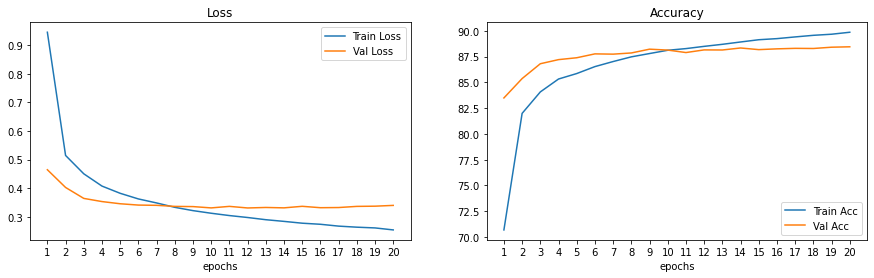

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,4))
x = np.arange(1,num_epochs+1)
for i in range(2):
    ax[i].plot(x, [train_loss_list, train_acc_list][i], label=["Train Loss","Train Acc"][i])
    ax[i].plot(x, [val_loss_list, val_acc_list][i], label=["Val Loss","Val Acc"][i])
    ax[i].legend()
    ax[i].set_xlabel('epochs')
    ax[i].set_xticks(x)
    ax[i].set_title(["Loss","Accuracy"][i])
plt.show()

시각화 결과 참고하여 적절한 모델 채택(validation 확인) + 저장된 모델의 매개변수 불러오기
- 충분히 낮은 Loss / 충분히 높은 Accuracy
- Train Acc > Val Acc 이 성립하는 작은 epoch
- 높고 안정적인 Val Acc

>ex. 출력 결과 및 그래프를 참고하여 이번 수행에서는 epoch 14, 20의 모델 채택

In [ ]:
# 새로운 모델 객체 2개 생성
tester1 = CNN().to(device)
tester2 = CNN().to(device) 
# 저장한 매개변수 불러오기
tester1.load_state_dict(torch.load("model-14_epochs.pt")) # epoch 14
tester2.load_state_dict(torch.load("model-20_epochs.pt")) # epoch 20

<All keys matched successfully>

모델 테스트

In [ ]:
# 평가(테스트) 모드
tester1.eval()
tester2.eval()

for i, tester in enumerate([tester1, tester2]):
    with torch.no_grad():
        correct = 0.0
        
        for img, lab in test_loader:
            img = img.to(device)
            lab = lab.to(device)
            out = tester(img)
            _, pred = torch.max(out.data, 1)
            correct += (pred==lab).sum().item()

        print("Accuracy of epoch {}: {:.2f}%".format([14, 20][i], 100 * correct / (len(test_loader)*batch_size)))

Accuracy of epoch 14: 88.36%
Accuracy of epoch 20: 88.38%


1. 현재 모델 구조 및 설정에서는 epoch 14 이후로 성능 개선이 크게 보이지 않음
2. 런타임 GPU 제약으로 비교적 단순한 모델 구조 사용
 - 신경망 구조 변화나 하이퍼파라미터 조정 등을 통해 EMNIST 분류 정확도를 95% 이상으로 개선 가능

### 스케줄러 실험
[How to Choose a Learning Rate Scheduler for Neural Networks](https://neptune.ai/blog/how-to-choose-a-learning-rate-scheduler)

**learning rate** (step-size) : the magnitude of change/update to model weights during the backpropagation training process
- basic concept of non-linear decay : policy where the learning rate decays faster when training begins, and then gradually flattens out to a small value towards the end of the training

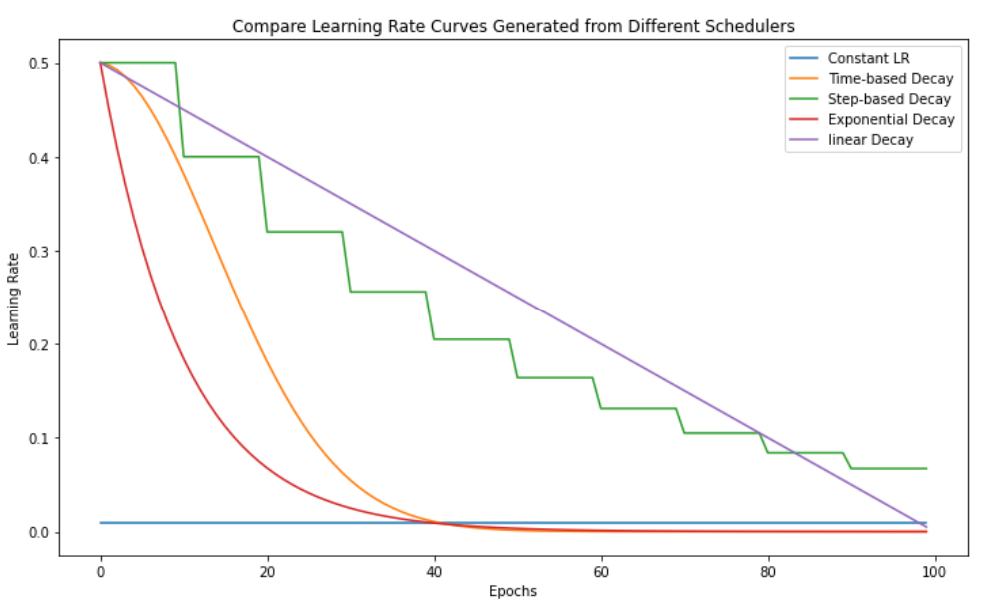

#### 스케줄러 참고
**[[1]](https://sanghyu.tistory.com/113) / [[2]](https://www.kaggle.com/code/isbhargav/guide-to-pytorch-learning-rate-scheduling)** : 스케줄러별 요약 정리

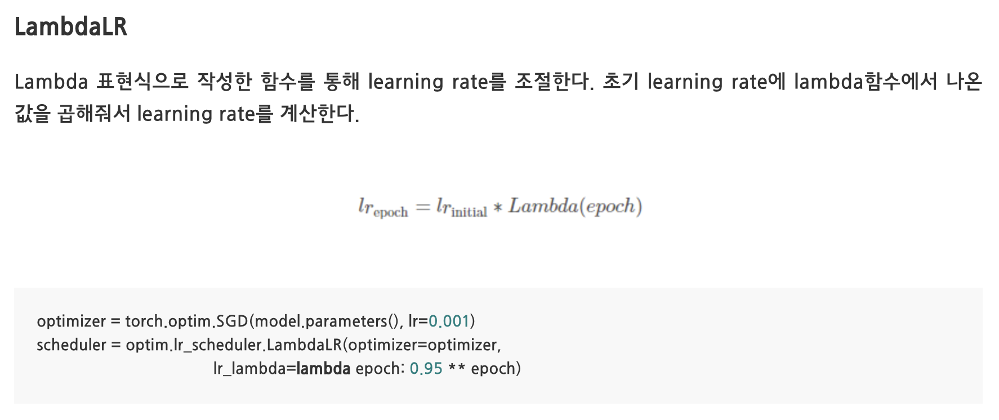

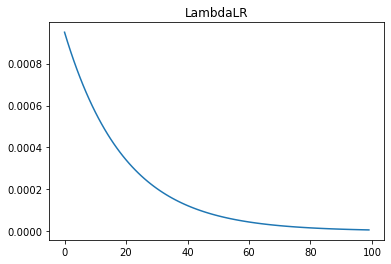

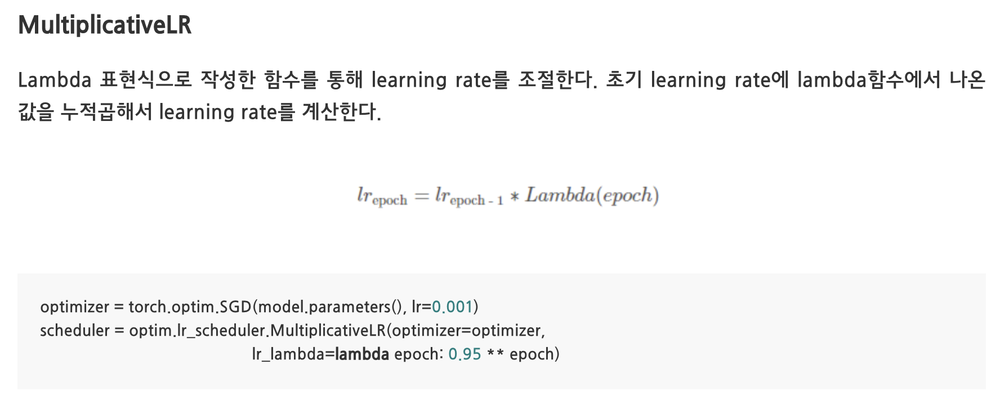

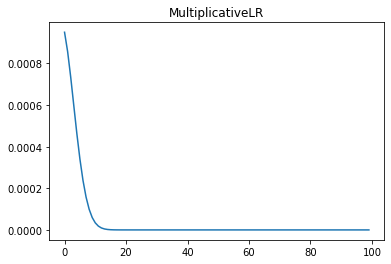

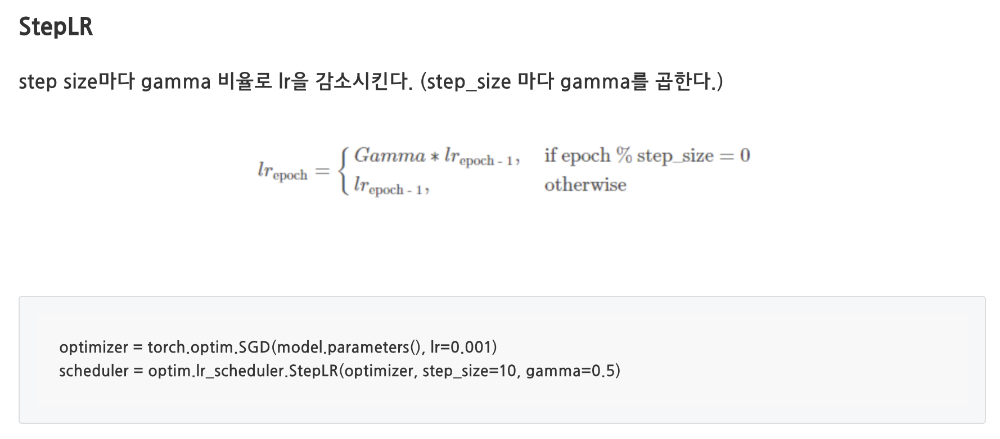

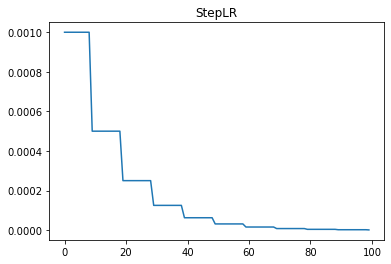

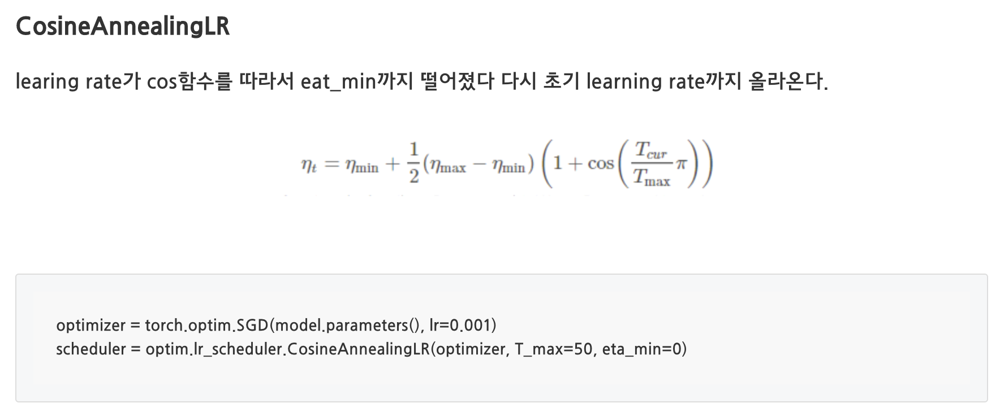

- T_max : 주기의 반으로 사용할 epoch
- eta_min : Cosine 함수의 최솟값

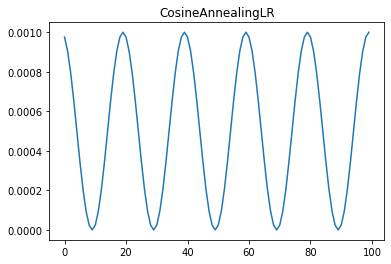

#### 실험 코드

Lambda_ Epoch [1/20]
                  Train Loss: 0.9491
                  Valid Acc: 82.85%
Lambda_ Epoch [2/20]
                  Train Loss: 0.5292
                  Valid Acc: 85.13%
Lambda_ Epoch [3/20]
                  Train Loss: 0.4548
                  Valid Acc: 86.26%
Lambda_ Epoch [4/20]
                  Train Loss: 0.4147
                  Valid Acc: 86.80%
Lambda_ Epoch [5/20]
                  Train Loss: 0.3865
                  Valid Acc: 87.18%
Lambda_ Epoch [6/20]
                  Train Loss: 0.3663
                  Valid Acc: 87.03%
Lambda_ Epoch [7/20]
                  Train Loss: 0.3469
                  Valid Acc: 87.78%
Lambda_ Epoch [8/20]
                  Train Loss: 0.3352
                  Valid Acc: 87.65%
Lambda_ Epoch [9/20]
                  Train Loss: 0.3220
                  Valid Acc: 87.95%
Lambda_ Epoch [10/20]
                  Train Loss: 0.3107
                  Valid Acc: 88.10%
Lambda_ Epoch [11/20]
                  Train Loss: 0.3029


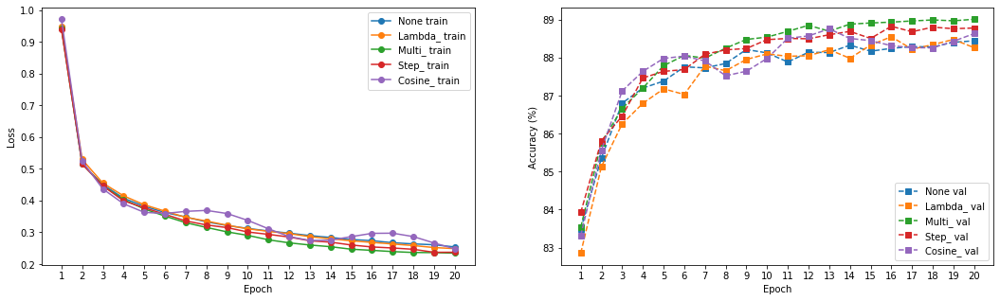

In [ ]:
# 스케줄러별 train_loss 및 val_acc 비교 시각화
S_NAME = ['None', 'Lambda_', 'Multi_', 'Step_', 'Cosine_']
fig, axes = plt.subplots(1,2,figsize=(18,5))
# 스케줄러를 사용하지 않는 경우는 위에서 학습된 결과 시각화
axes[0].plot(range(1, num_epochs+1), train_loss_list,
             marker='o', color=f'C{0}', label=S_NAME[0]+" train")
axes[1].plot(range(1, num_epochs+1), val_acc_list,
             marker='s', color=f'C{0}', label=S_NAME[0]+" val", linestyle='dashed')

for s in range(1,5):
    train_loss = []
    val_acc = []
    model = CNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # 스케줄러별 적절한 튜닝 필요
    scheduler = [optim.lr_scheduler.LambdaLR(optimizer=optimizer, lr_lambda=lambda epoch: 0.98**epoch),
                 optim.lr_scheduler.MultiplicativeLR(optimizer=optimizer, lr_lambda=lambda epoch: 0.98**epoch),
                 optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.85),
                 optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=4, eta_min=0.0003)][s-1]

    for epoch in range(num_epochs):
        model.train()
        TL = 0.0
        for i, (images, labels) in enumerate(train_loader):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            t_loss = criterion(outputs, labels) 
            optimizer.zero_grad()
            t_loss.backward()
            optimizer.step()
            TL += t_loss.item()

        # 1 epoch마다 스케줄러 실행 ; optimizer의 lr 갱신
        scheduler.step()

        model.eval()
        VA = 0
        with torch.no_grad():
            for i, (images, labels) in enumerate(valid_loader):
                images = images.to(device)
                labels = labels.to(device)
                outputs = model(images)
                _, pred = torch.max(outputs.data, 1)
                VA += (pred==labels).sum().item()
        
        TL /= len(train_loader)
        VA = 100 * VA / (len(valid_loader)*batch_size)

        # 해당 스케줄러에서 epoch마다 결과 출력
        print(f'''{S_NAME[s]} Epoch [{epoch+1}/{num_epochs}]
                  Train Loss: {TL:.4f}
                  Valid Acc: {VA:.2f}%''')
        
        train_loss.append(TL)
        val_acc.append(VA)
    axes[0].plot(range(1, num_epochs+1), train_loss,
                 marker='o', color=f'C{s}', label=S_NAME[s]+" train")
    axes[1].plot(range(1, num_epochs+1), val_acc,
                 marker='s', color=f'C{s}', label=S_NAME[s]+" val", linestyle='dashed')

axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend(loc='upper right')
axes[0].set_xticks(range(1,num_epochs+1))

axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].legend(loc='lower right')
axes[1].set_xticks(range(1,num_epochs+1))

plt.show()

#### [LRBench](https://arxiv.org/pdf/1908.06477.pdf)
LR benchmarking system to support **automated or semi-automated evaluation and selection of good LR policies**

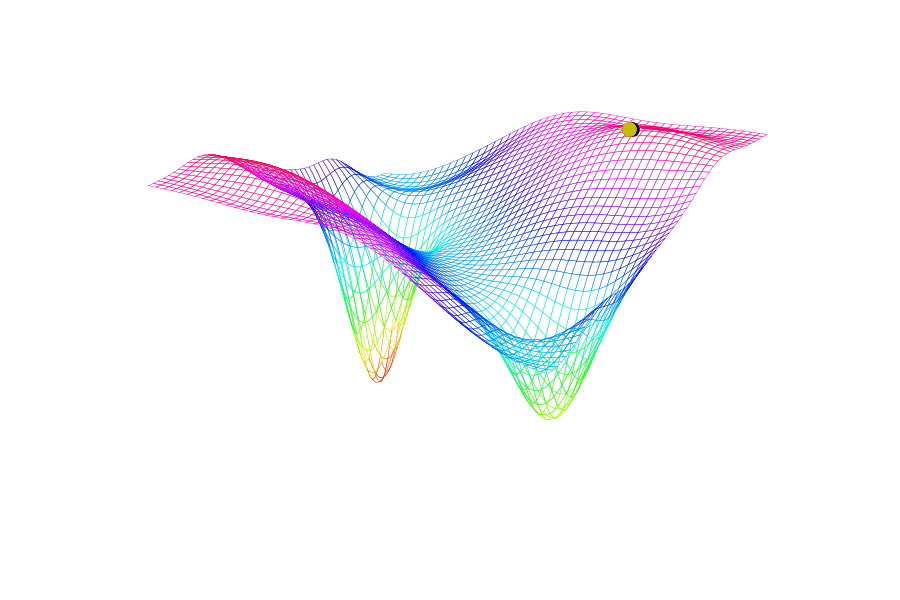

In [ ]:
# Ex. https://github.com/git-disl/LRBench
# Black >>> FIX (k=0.025) : local optimum  
# Red >>> NSTEP (k=0.05, γ=0.1, l=[150, 180]) : global optimum  
# Yellow >>> TRIEXP (k0=0.05, k1=0.3, γ=0.1, l=100) : started fastest, failed to converge, high fluctuation
from IPython.display import Image
fname = 'FIX-NSTEP-TRIEXP-Comparison.gif'
Image(open(fname, 'rb').read())

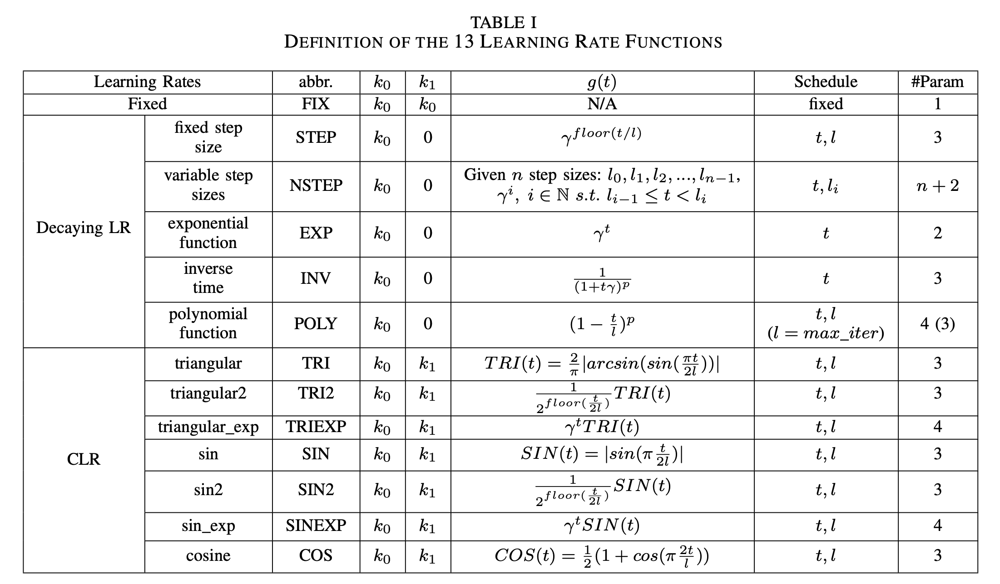

$\large{\eta(t)=|k_0-k_1|g(t)+min(k_0,k_1)}$  
>$l$ : iterations per epoch  
$t$ : current iteration  
$k_0,k_1$ : learning rate refinement value range
- $k_0$ : initial learning rate
- $k_1$ : appropriate boundary value ​​according to the  type of scheduler

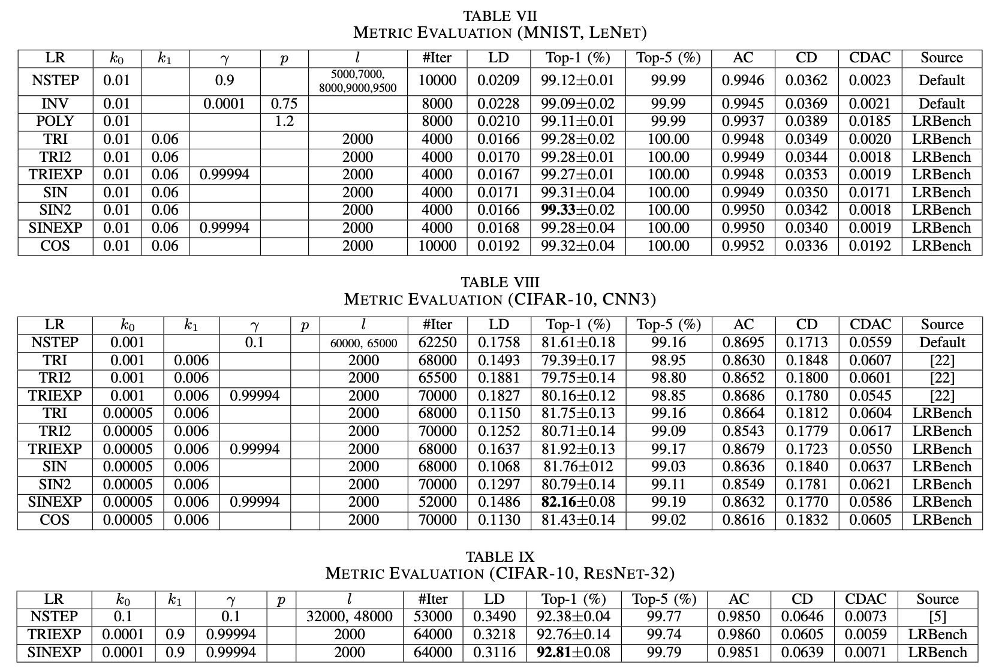

**※** EVALUATION METRICS FOR LR POLICIES
- Utility
>**Average Confidence** (AC ; 맞힌 확률의 평균)  
$AC(P_\theta,\vec{X})=\dfrac{1}{NS}\sum\limits_{i=1}^{n}P_\theta(X_i)_{y_i}count(F_\theta(X_i)=y_i)\,,\quad NS=\sum\limits_{i=1}^ncount(F_\theta(X_i)=y_i)$  
>**Confidence Deviation** (CD ; 맞힌 확률의 표준편차)  
$CD(P_\theta,\vec{X})=std_i(P_\theta(X_i))\quad s.t.\quad F_\theta(X_i)=y_i$  
>**Confidence Deviation Across Classes** (CDAC ; 클래스별 맞힌 확률의 표준편차)  
$CDAC(P_\theta,\vec{X})=std_i(AC_i)\,,\quad AC_i=\dfrac{\sum_{j=1}^{n}P_\theta(X_j)_icount(F_\theta(X_j)=y_j=i)}{\sum_{j=1}^{n}count(F_\theta(X_j)=y_j=i)}$
- Cost and Robustness
>**#Parameters**  
>**#Iterations at the Highest Top-1 Accuracy**  
>**Loss Difference** : $LD=test\_loss-train\_loss$

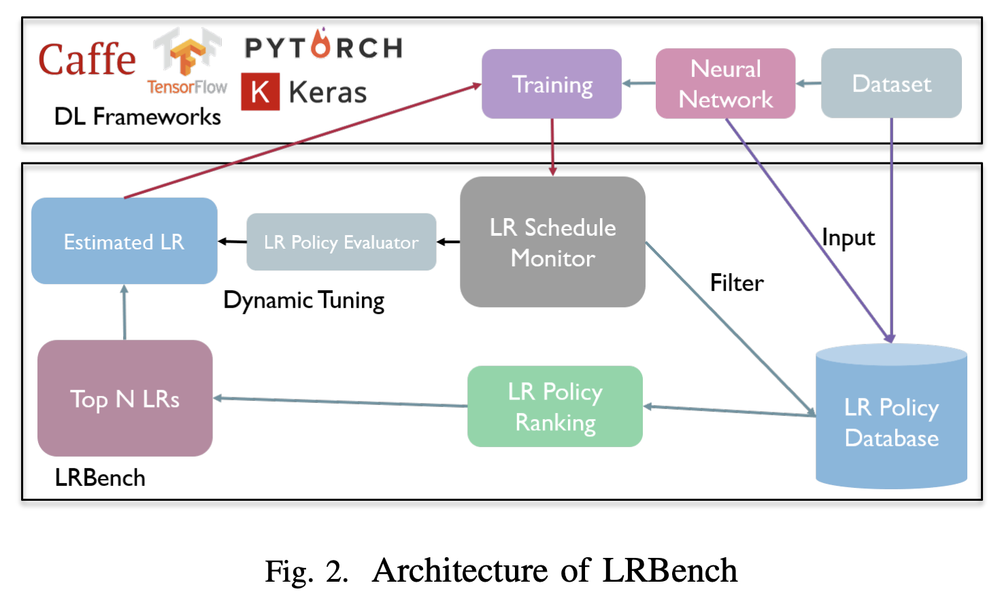

💡 *Complex interactions between good LR policies and different GD optimizers*

---

# Pretrained model (사전 학습 모델)

- `torchvision.models` 내에 저장되어 있는 여러 (pretrained) model 활용 가능
- [OpenCV의 pretrained model을 통한 image classification](https://learnopencv.com/pytorch-for-beginners-image-classification-using-pre-trained-models)

## 1) torchvision의 pretrained model 불러오기

`torchvision.models` 라이브러리에 포함되어 있는 모델 목록
- model의 이름 부분이 CamelCase인 항목은 클래스, 그렇지 않은 항목은 클래스를 객체화한 함수 형태

In [ ]:
from torchvision import models
dir(models)

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

alexnet, resnet101, vgg16 모델을 각각의 학습된(pretrained) 매개변수와 함께 불러온 후 평가 모드로 설정

In [ ]:
# alexnet = models.alexnet(pretrained=True) # 학습된 매개변수를 함수의 인자를 통해 불러오는 방식으로 변경
alexnet = models.alexnet(weights='DEFAULT').to(device) # None : not pretrained
alexnet.eval()

resnet = models.resnet101(weights='DEFAULT').to(device)
resnet.eval()

vggnet = models.vgg16(weights='DEFAULT').to(device)
vggnet.eval()

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet101-cd907fc2.pth" to /root/.cache/torch/hub/checkpoints/resnet101-cd907fc2.pth


  0%|          | 0.00/171M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# input_size 없이 매개변수 틀만 확인
print(alexnet)
print(resnet)
print(vggnet)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
# input_size를 통해 모델 요약 확인
# 입력 데이터는 채널 3개, 224 * 224 형태의 이미지
# 단, 원래 AlexNet은 paper에 따르면 227 * 227
torchsummary.summary(alexnet, input_size=(3,224,224), device=device.type)
torchsummary.summary(resnet, input_size=(3,224,224), device=device.type)
torchsummary.summary(vggnet, input_size=(3,224,224), device=device.type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

>[**AlexNet of PyTorch**](https://pytorch.org/vision/main/models/generated/torchvision.models.alexnet.html#alexnet)

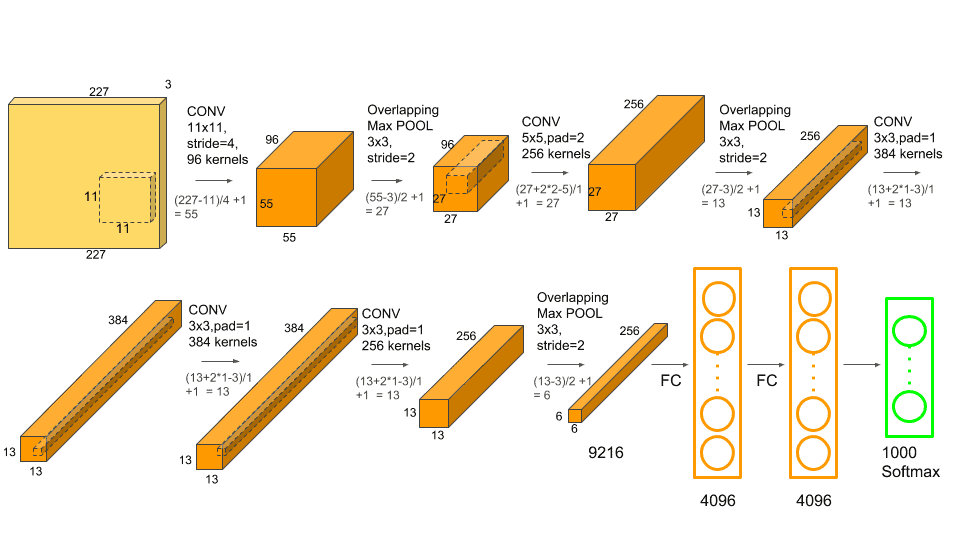

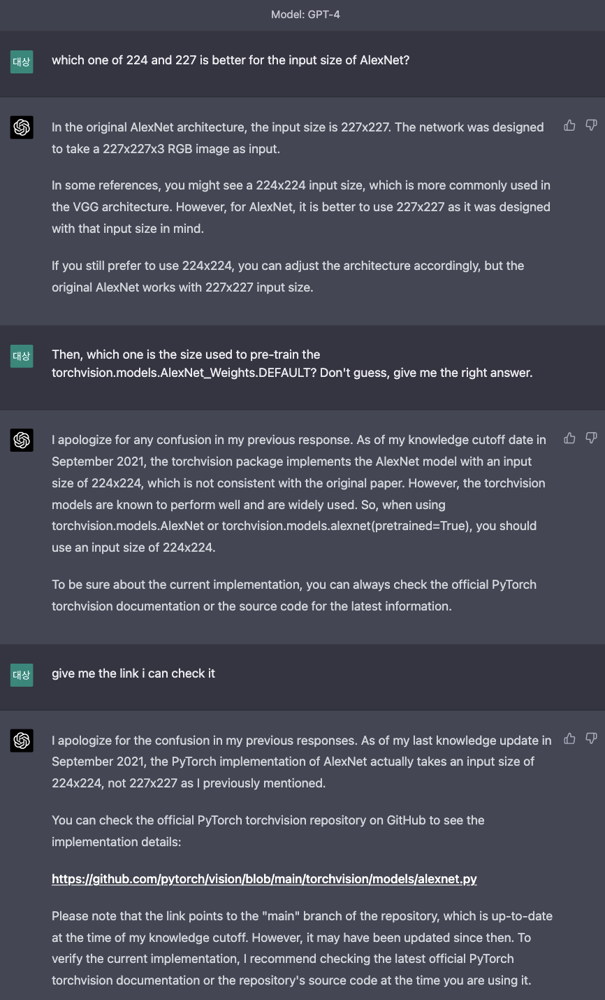

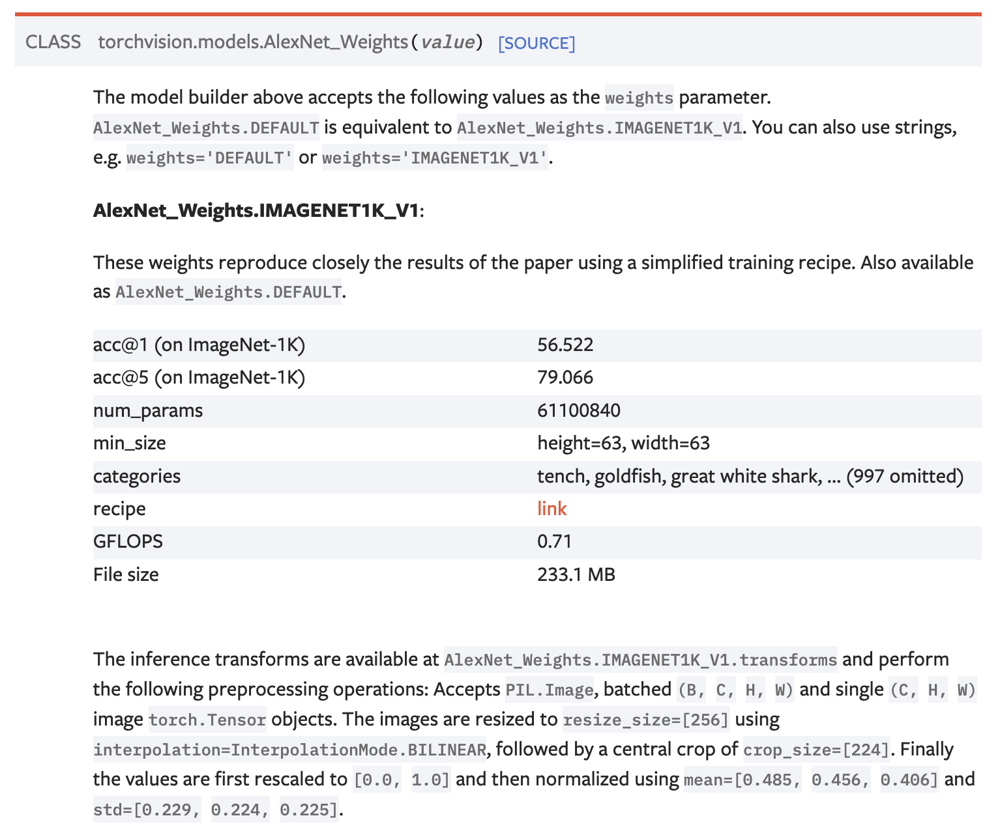

## 2) '추론(inference)'을 위한 데이터 준비
- 이미지 불러오기 및 전처리
- 이미지 클래스 목록

※ 추론할 데이터의 전처리를 위해 pretrained 매개변수를 학습시킨 데이터의 전처리 과정 확인 ; 위의 PyTorch Docs 이미지 참고
- `resize_size=[256]` $\rightarrow$ `crop_size=[224]` $\rightarrow$ rescale to `[0.0, 1.0]` $\rightarrow$ `mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]`
- `transforms`로 전처리 파이프라인 구축

In [ ]:
# transform = models.AlexNet_Weights.DEFAULT.transforms()
transform = transforms.Compose([transforms.Resize(256),
                                transforms.CenterCrop(224),
                                transforms.ToTensor(), # [0.0, 1.0]
                                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

In [ ]:
# 이미지 준비
from google.colab import files
files.upload()

In [ ]:
# 불러오기
from PIL import Image
img_dog = Image.open("dog.jpg")
img_wal = Image.open("wallet.jpg")

<img src = "https://drive.google.com/uc?id=1PBHtwZQ6DjK3FX8F0GZCWqSJXS3WR7LM" height = 200 width = 240>
<img src = "https://drive.google.com/uc?id=1U1uAi1aqqAvyyT5DXIQJEsYk-Q_1Ux7d" height = 200 width = 240>


래브라도 리트리버(labrador retriever) / 지갑(wallet)

- 위에서 정의한 transform 함수로 이미지 전처리
- unsqueeze 함수로 신경망 입력 차원(배치 형식)에 맞게 변환

In [ ]:
# 전처리
img_dog_t = transform(img_dog)
batch1_t = torch.unsqueeze(img_dog_t, 0).to(device)

img_wallet_t = transform(img_wal)
batch2_t = torch.unsqueeze(img_wallet_t, 0).to(device)

세 모델 모두 동일한 ImageNet dataset (클래스 범주 1000개)에서 사전 학습 $\rightarrow$ 동일한 클래스 목록 사용 가능

In [ ]:
# 클래스 목록 일치 여부 확인
Ac = models.AlexNet_Weights.DEFAULT.meta['categories']
Rc = models.ResNet101_Weights.DEFAULT.meta['categories']
Vc = models.VGG16_Weights.DEFAULT.meta['categories']
print(Ac==Rc==Vc)
classes = Ac

True


In [ ]:
len(classes)

1000

## 3) 분류 결과

평가(추론) 모드인 alexnet, vggnet, resnet에 전처리한 이미지 데이터 입력

In [ ]:
# 위에서 평가 모드 미리 설정
out1_alex = alexnet(batch1_t)
out2_alex = alexnet(batch2_t)

out1_res = resnet(batch1_t)
out2_res = resnet(batch2_t)

out1_vgg = vggnet(batch1_t)
out2_vgg = vggnet(batch2_t)

1. 래브라도 리트리버 이미지 분류 결과

In [ ]:
# 출력 값을 확률(%)로 변환
percentage1_alex = F.softmax(out1_alex, dim=1)[0] * 100
percentage1_res = F.softmax(out1_res, dim=1)[0] * 100
percentage1_vgg = F.softmax(out1_vgg, dim=1)[0] * 100

names = ['AlexNet', 'ResNet', 'VGGNet']
per1s = [percentage1_alex, percentage1_res, percentage1_vgg]

# 분류 확률 상위 5개의 클래스 확인
print('[labrador retriever]')
print()
for i in range(len(names)):
    print(f'--- Top 5 Classification by {names[i]} ---')
    top5_p, top5_c = torch.topk(per1s[i], 5)
    for j in range(top5_p.size(0)):
        print(classes[top5_c[j]], top5_p[j].item())
    print()

[labrador retriever]

--- Top 5 Classification by AlexNet ---
Labrador retriever 41.58515930175781
golden retriever 16.591659545898438
Saluki 16.286876678466797
whippet 2.853910207748413
Ibizan hound 2.3924787044525146

--- Top 5 Classification by ResNet ---
Labrador retriever 58.8238410949707
kelpie 1.907867431640625
golden retriever 0.8205392360687256
tennis ball 0.7181963324546814
Chesapeake Bay retriever 0.5543163418769836

--- Top 5 Classification by VGGNet ---
Labrador retriever 58.63431167602539
golden retriever 6.773660182952881
kelpie 3.932811975479126
dingo 3.2133333683013916
Chesapeake Bay retriever 2.8467142581939697



>ResNet, VGGNet이 AlexNet에 비해 잘 분류함

2. 지갑 이미지 분류 결과

In [ ]:
percentage2_alex = F.softmax(out2_alex, dim=1)[0] * 100
percentage2_res = F.softmax(out2_res, dim=1)[0] * 100
percentage2_vgg = F.softmax(out2_vgg, dim=1)[0] * 100

names = ['AlexNet', 'ResNet', 'VGGNet']
per2s = [percentage2_alex, percentage2_res, percentage2_vgg]

print('[wallet]')
print()
for i in range(len(names)):
    print(f'--- Top 5 Classification by {names[i]} ---')
    top5_p, top5_c = torch.topk(per2s[i], 5)
    for j in range(top5_p.size(0)):
        print(classes[top5_c[j]], top5_p[j].item())
    print()

[wallet]

--- Top 5 Classification by AlexNet ---
grand piano 27.075416564941406
iPod 15.27748966217041
racket 11.054483413696289
harmonica 3.0107932090759277
pencil box 2.9472758769989014

--- Top 5 Classification by ResNet ---
wallet 49.16739273071289
purse 36.701839447021484
mailbag 0.2522256672382355
sandal 0.23707416653633118
iPod 0.22778859734535217

--- Top 5 Classification by VGGNet ---
wallet 54.90801239013672
purse 22.119564056396484
holster 7.969637393951416
Loafer 5.719691276550293
buckle 3.6906778812408447



>ResNet, VGGNet은 wallet 또는 purse로 잘 분류하지만, AlexNet은 완전히 다른 범주로 분류함

🏆 대체로 ***ResNet > VGG16 > AlexNet*** 순으로 분류 정확도가 높음

>torchvision의 이미지 분류를 위한 pretrained models 테스트 결과
- **Top-1 error** : 분류 확률이 가장 높은 클래스가 정답이 아닌 경우의 비율
- **Top-5 error** : 분류 확률 상위 5개 클래스에 정답이 없는 경우의 비율

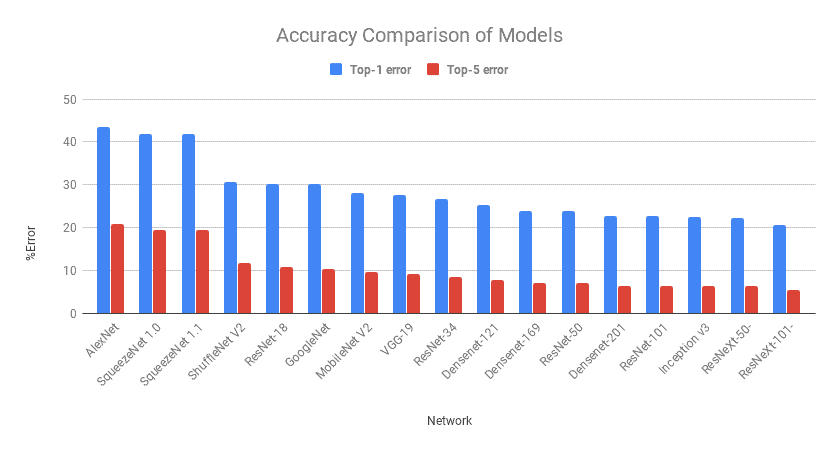

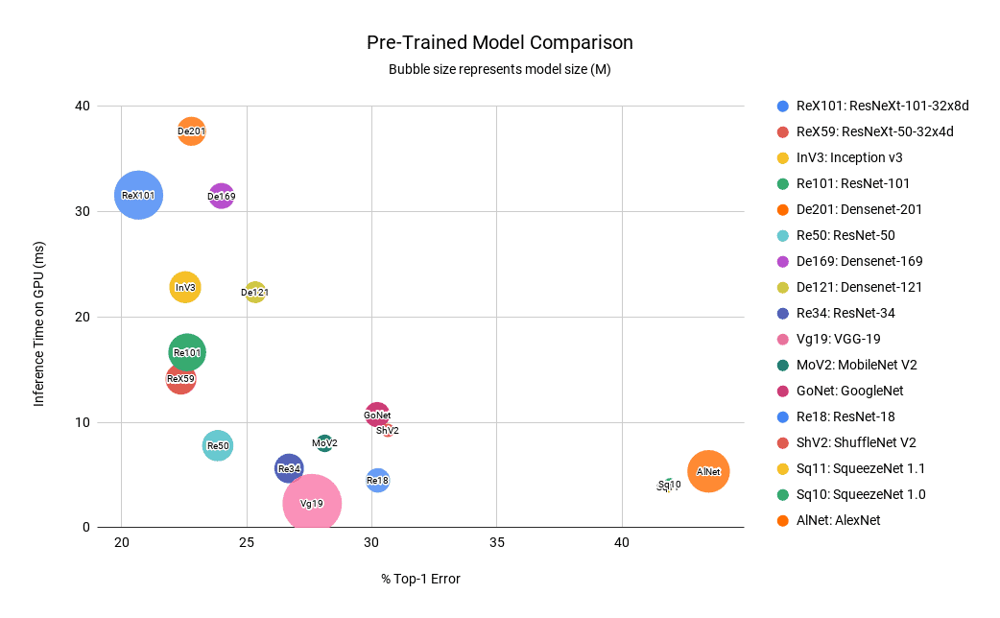